#Startup Investment

#Laod the data

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as py
from pathlib import Path
from scipy import stats
from sklearn.preprocessing import PowerTransformer
from scipy.stats import boxcox

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
df_objects = pd.read_csv('/content/drive/MyDrive/תואר /שנה ג/סמסטר ב/תאוריה סטטיסטית/dataset/objects.csv', dtype={'parent_id':'object', 'category_code': 'object', 'short_description': 'object', 'description': 'object', 'country_code': 'object', 'state_code': 'object', 'city': 'object', 'created_by': 'object'}, parse_dates=[9, 10, 25, 26, 29, 30, 33, 34])
df_funding_rounds = pd.read_csv('/content/drive/MyDrive/תואר /שנה ג/סמסטר ב/תאוריה סטטיסטית/dataset/funding_rounds.csv', parse_dates=[3])
df_funds = pd.read_csv('/content/drive/MyDrive/תואר /שנה ג/סמסטר ב/תאוריה סטטיסטית/dataset/funds.csv', parse_dates=[3])
df_acquisitions = pd.read_csv('/content/drive/MyDrive/תואר /שנה ג/סמסטר ב/תאוריה סטטיסטית/dataset/acquisitions.csv')
df_offices = pd.read_csv('/content/drive/MyDrive/תואר /שנה ג/סמסטר ב/תאוריה סטטיסטית/dataset/offices.csv')
df_relationships = pd.read_csv('/content/drive/MyDrive/תואר /שנה ג/סמסטר ב/תאוריה סטטיסטית/dataset/relationships.csv')

<ipython-input-4-5d4401b266c4>:3: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



In [5]:
#df_objects.head()#expain the name of the company and in this project, the name that given in the format "c:1"
#df_acquisitions.head()# explain witch company acqusitions so they get payed and when
#df_funds.head()#explain who the one that fund witch company and how much they invest
#df_funding_rounds.head()#expalin when and in witch raond the company get fund
#df_ipos.head()#Initial Public Offerings
#df_milestones.head()# milestone in the company that they got
#df_offices.head()#where the main office of the company
#df_relationships.head()#people and where they are work
print(df_objects.shape,"df_objects.shape")
print(df_acquisitions.shape,"df_acquisitions.shape")
print(df_funds.shape,"df_funds.shape")
print(df_funding_rounds.shape,"df_funding_rounds.shape")
print(df_offices.shape,"df_offices.shape")
print(df_relationships.shape,"df_relationships.shape")

(462651, 40) df_objects.shape
(9562, 12) df_acquisitions.shape
(1564, 11) df_funds.shape
(52928, 23) df_funding_rounds.shape
(112718, 15) df_offices.shape
(402878, 11) df_relationships.shape


#Claen the data

In [6]:
#clean the data a little bit because this columns are unnecessary
df_acquisitions = df_acquisitions.drop('source_url', axis=1)
df_funding_rounds = df_funding_rounds.drop('source_url', axis=1)
df_acquisitions['acquired_at'] = df_acquisitions['acquired_at'].apply(pd.to_datetime, errors='coerce')
df_acquisitions['acquired_at'] = pd.to_datetime(df_acquisitions['acquired_at'], format='%Y-%m-%d')

###Create companies data

In [7]:
companies = df_objects[
    (df_objects['entity_type'] == 'Company') &
    (~df_objects['country_code'].isin(['CSS', 'FST']))
]
print(companies.shape)
companies.head(1)

(196498, 40)


,id,entity_type,entity_id,parent_id,name,normalized_name,permalink,category_code,status,founded_at,...,last_funding_at,funding_rounds,funding_total_usd,first_milestone_at,last_milestone_at,milestones,relationships,created_by,created_at,updated_at
0,c:1,Company,1,NaN,Wetpaint,wetpaint,/company/wetpaint,web,operating,2005-10-17,...,2008-05-19,3,39750000.0,2010-09-05,2013-09-18,5,17,initial-importer,2007-05-25 06:51:27,2013-04-13 03:29:00


In [8]:
companies.drop(columns=['homepage_url','domain','twitter_username','logo_url','logo_height','logo_width','short_description','overview',
'tag_list','entity_type','parent_id','name','permalink'], inplace=True)
companies.rename(columns={'relationships': 'employees'}, inplace=True)
companies.head(1)

<ipython-input-8-a3c2e64c5a36>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-8-a3c2e64c5a36>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,entity_id,normalized_name,category_code,status,founded_at,closed_at,description,country_code,state_code,...,last_funding_at,funding_rounds,funding_total_usd,first_milestone_at,last_milestone_at,milestones,employees,created_by,created_at,updated_at
0,c:1,1,wetpaint,web,operating,2005-10-17,NaT,Technology Platform Company,USA,WA,...,2008-05-19,3,39750000.0,2010-09-05,2013-09-18,5,17,initial-importer,2007-05-25 06:51:27,2013-04-13 03:29:00


In [9]:
print(companies.columns)
print(companies['status'].value_counts())

Index(['id', 'entity_id', 'normalized_name', 'category_code', 'status',
       'founded_at', 'closed_at', 'description', 'country_code', 'state_code',
       'city', 'region', 'first_investment_at', 'last_investment_at',
       'investment_rounds', 'invested_companies', 'first_funding_at',
       'last_funding_at', 'funding_rounds', 'funding_total_usd',
       'first_milestone_at', 'last_milestone_at', 'milestones', 'employees',
       'created_by', 'created_at', 'updated_at'],
      dtype='object')
status
operating    183387
acquired       9393
closed         2584
ipo            1134
Name: count, dtype: int64


In [10]:
fig = px.pie(
    companies.groupby('status')['id'].count().reset_index(),
    values='id',
    names='status'
)
fig.show()

In [11]:
#clean a little bit more
companies_clean = companies[~(
   companies['category_code'].isnull() |
   companies['country_code'].isnull() |
   companies['founded_at'].isnull()
)]
print(companies_clean.shape)
companies_clean.head(1)

(64053, 27)


,id,entity_id,normalized_name,category_code,status,founded_at,closed_at,description,country_code,state_code,...,last_funding_at,funding_rounds,funding_total_usd,first_milestone_at,last_milestone_at,milestones,employees,created_by,created_at,updated_at
0,c:1,1,wetpaint,web,operating,2005-10-17,NaT,Technology Platform Company,USA,WA,...,2008-05-19,3,39750000.0,2010-09-05,2013-09-18,5,17,initial-importer,2007-05-25 06:51:27,2013-04-13 03:29:00


In [12]:
print(companies_clean.shape)

(64053, 27)


####Visual on companues

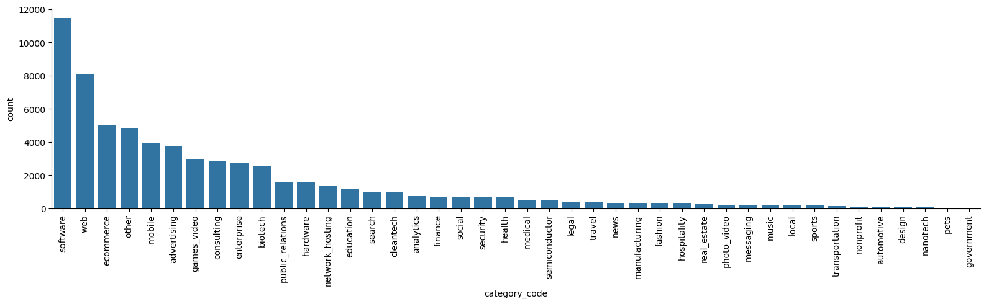

In [13]:
# barplot with companies categories

p = sns.catplot(
    data = companies_clean.sort_values('category_code'),
    x = 'category_code',
    kind = 'count',
    order = companies_clean['category_code'].value_counts().index,
    height = 4,
    aspect = 4,
    color = 'tab:blue'
    # palette = 'Blues'
)
for item in p.ax.get_xticklabels():
    item.set_rotation(90)

[Text(0.5, 1.0, 'Top 10 countries')]

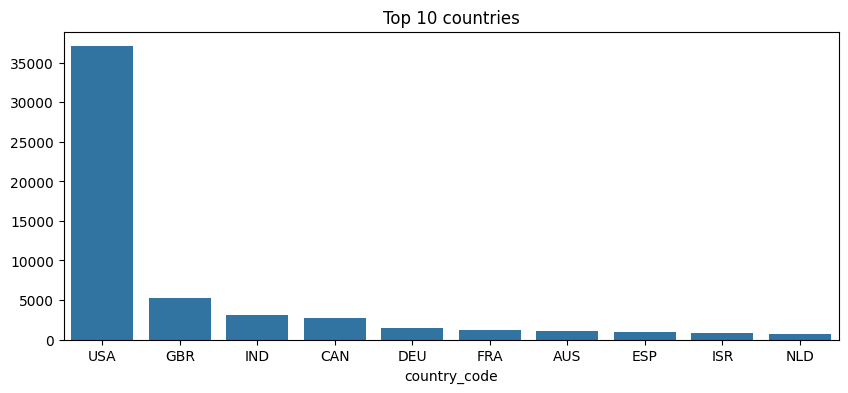

In [14]:
plt.figure(figsize=(10,4))
sns.barplot(
    x=companies_clean['country_code'].value_counts().index[0:10],
    y=companies_clean['country_code'].value_counts().values[0:10],
    order=companies_clean['country_code'].value_counts().index[0:10],
    color = 'tab:blue',

).set(title='Top 10 countries')

In [15]:
# Plot the physical offices in a map
fig = px.density_mapbox(
    df_offices,
    lat='latitude',
    lon='longitude',
    zoom=2,
    height=300,
    hover_name='city',
    # color_discrete_sequence=['blue'],
    hover_data={'description', 'address1', 'object_id'},
    radius=5,
)

fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.update_layout(mapbox_center_lat=45, mapbox_center_lon=-25)
fig.show()

## Creat acquired_companies data

In [16]:
#Enters the data of the purchases
acquired_companies = companies_clean[companies['status'] == 'acquired']
print(acquired_companies.columns)
acquired_companies.head(1)

Index(['id', 'entity_id', 'normalized_name', 'category_code', 'status',
       'founded_at', 'closed_at', 'description', 'country_code', 'state_code',
       'city', 'region', 'first_investment_at', 'last_investment_at',
       'investment_rounds', 'invested_companies', 'first_funding_at',
       'last_funding_at', 'funding_rounds', 'funding_total_usd',
       'first_milestone_at', 'last_milestone_at', 'milestones', 'employees',
       'created_by', 'created_at', 'updated_at'],
      dtype='object')


<ipython-input-16-edef09fcd755>:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,id,entity_id,normalized_name,category_code,status,founded_at,closed_at,description,country_code,state_code,...,last_funding_at,funding_rounds,funding_total_usd,first_milestone_at,last_milestone_at,milestones,employees,created_by,created_at,updated_at
13,c:1001,1001,friendfeed,web,acquired,2007-10-01,NaT,Social network aggregator,USA,CA,...,2008-02-26,1,5000000.0,2008-05-01,2012-09-13,3,14,initial-importer,2007-10-01 10:17:13,2013-03-13 21:44:15


In [17]:
acquired_companies.shape

(3899, 27)

In [18]:
#add how much the they get from acquisition their startup
df_acquisitions.rename(columns={'id': 'number'}, inplace=True)
df_acquisitions.rename(columns={'acquired_object_id': 'id'}, inplace=True)
df_acquisitions.drop(columns=['acquisition_id','term_code','number'], inplace=True)
print(df_acquisitions.shape)

(9562, 8)


In [19]:
merged_df = pd.merge(df_acquisitions,acquired_companies, on='id')
print(merged_df.shape)
merged_df.head(1)

(3991, 34)


,acquiring_object_id,id,price_amount,price_currency_code,acquired_at,source_description,created_at_x,updated_at_x,entity_id,normalized_name,...,last_funding_at,funding_rounds,funding_total_usd,first_milestone_at,last_milestone_at,milestones,employees,created_by,created_at_y,updated_at_y
0,c:59,c:72,60000000.0,USD,2007-07-01,Deal is Confirmed: Google Acquired GrandCentral,2007-07-03 08:14:50,2011-05-06 21:51:05,72,grandcentral,...,2006-01-01,1,4000000.0,2005-11-03,2013-09-12,4,9,initial-importer,2007-06-25 19:12:09,2013-12-04 22:38:53


##Final data set

In [20]:
#create new df that nice to work with
columns_to_keep = ['id','acquiring_object_id','price_amount','funding_total_usd','acquired_at','milestones', 'employees','investment_rounds','category_code','country_code']  # List of columns to keep
df = merged_df[columns_to_keep].copy()  # Create a new DataFrame with selected columns

In [21]:
df['acquired_at'] = pd.to_datetime(df['acquired_at'])

In [22]:
print(df.shape)
print(df.columns)
df.head(5)

(3991, 10)
Index(['id', 'acquiring_object_id', 'price_amount', 'funding_total_usd',
       'acquired_at', 'milestones', 'employees', 'investment_rounds',
       'category_code', 'country_code'],
      dtype='object')


,id,acquiring_object_id,price_amount,funding_total_usd,acquired_at,milestones,employees,investment_rounds,category_code,country_code
0,c:72,c:59,60000000.0,4000000.0,2007-07-01,4,9,0,mobile,USA
1,c:132,c:24,280000000.0,5000000.0,2007-05-01,5,21,0,music,GBR
2,c:155,c:59,100000000.0,8000000.0,2007-06-01,4,16,0,web,USA
3,c:215,c:212,25000000.0,0.0,2007-07-01,0,2,0,web,USA
4,c:228,c:227,7140000.0,0.0,2003-08-05,4,1,0,web,KOR


#Inflation

##df_funding_rounds

In [23]:
df_funding_rounds.shape

(52928, 22)

In [24]:
df_funding_rounds.rename(columns={'id': 'number'}, inplace=True)
df_funding_rounds.rename(columns={'object_id': 'id'}, inplace=True)

In [25]:
columns_to_keep = ['id','funded_at','raised_amount_usd']  # List of columns to keep
df_funding_rounds = df_funding_rounds[columns_to_keep].copy()  # Create a new DataFrame with selected columns

In [26]:
df_funding_rounds= pd.merge(df_funding_rounds,df, on='id')
columns_to_keep = ['id','funded_at','raised_amount_usd','acquired_at']
df_funding_rounds = df_funding_rounds[columns_to_keep].copy()
df_funding_rounds['acquired_at'] = df_funding_rounds['acquired_at'].apply(pd.to_datetime, errors='coerce')
df_funding_rounds['funded_at'] = df_funding_rounds['funded_at'].apply(pd.to_datetime, errors='coerce')
df_funding_rounds.head()

,id,funded_at,raised_amount_usd,acquired_at
0,c:4,2006-12-01,8500000.0,2012-07-12
1,c:7299,2006-05-01,10500000.0,2009-12-16
2,c:7299,2006-05-01,10500000.0,2007-05-30
3,c:9,2007-01-01,1500000.0,2012-11-28
4,c:9,2007-03-01,10000000.0,2012-11-28


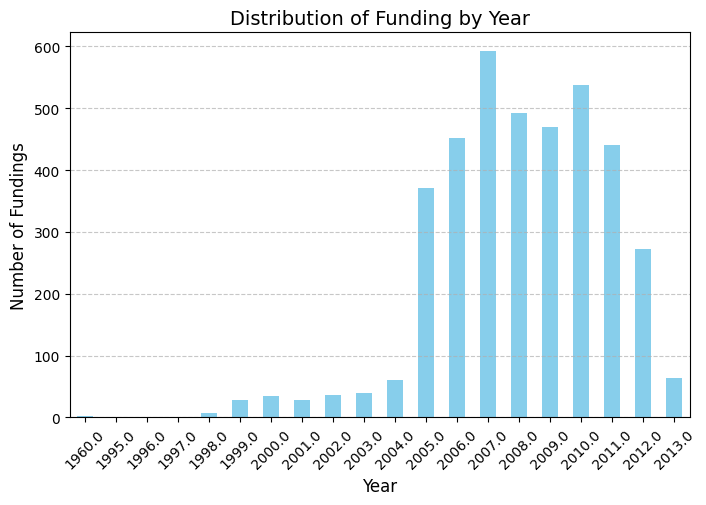

In [27]:
# Convert 'funded_at' to datetime for proper plotting
df_funding_rounds['funded_at'] = pd.to_datetime(df_funding_rounds['funded_at'])

# Plotting a histogram of the 'funded_at' column
plt.figure(figsize=(8, 5))
df_funding_rounds['funded_at'].dt.year.value_counts().sort_index().plot(kind='bar', color='skyblue')

# Setting title and labels
plt.title('Distribution of Funding by Year', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Fundings', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot
plt.show()

##The calculation

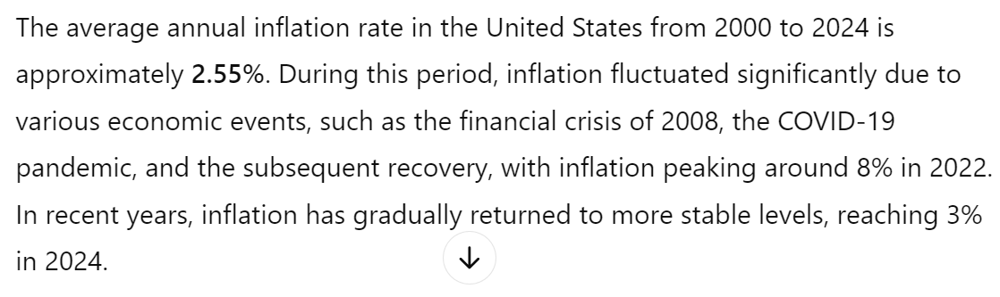

In [28]:
df_funding_rounds['years_diff'] = (df_funding_rounds['acquired_at'] - df_funding_rounds['funded_at']).dt.days / 365.25
inflation_rate = 0.0255

# Calculate inflation multiplier: (1 + inflation_rate) ** years_diff
df_funding_rounds['inflation_multiplier'] = (1 + inflation_rate) ** df_funding_rounds['years_diff']

df_funding_rounds['adjusted_raised_amount'] = df_funding_rounds['raised_amount_usd'] * df_funding_rounds['inflation_multiplier']
df_funding_rounds.shape


(3942, 7)

In [29]:
# Group by 'id' and sum the original and adjusted raised amounts
df_grouped = df_funding_rounds.groupby('id')[['raised_amount_usd', 'adjusted_raised_amount']].sum().reset_index()
df_grouped.shape

(1918, 3)

In [30]:
df = pd.merge(df_grouped, df, on='id', how='right')
df.shape

(3991, 12)

In [31]:
df['funding_total_usd'] = df['adjusted_raised_amount'].fillna(df['funding_total_usd'])
# Drop the original `adjusted_raised_amount` column
df = df.drop(columns=['adjusted_raised_amount','raised_amount_usd','investment_rounds'])
df.head()

,id,acquiring_object_id,price_amount,funding_total_usd,acquired_at,milestones,employees,category_code,country_code
0,c:72,c:59,60000000.0,4.153434e+06,2007-07-01,4,9,mobile,USA
1,c:132,c:24,280000000.0,5.127412e+06,2007-05-01,5,21,music,GBR
2,c:155,c:59,100000000.0,8.470731e+06,2007-06-01,4,16,web,USA
3,c:215,c:212,25000000.0,0.000000e+00,2007-07-01,0,2,web,USA
4,c:228,c:227,7140000.0,0.000000e+00,2003-08-05,4,1,web,KOR


In [32]:
df['profit'] = df['price_amount'] - df['funding_total_usd']

In [33]:
has_nan = df['funding_total_usd'].isna().any()
print(has_nan)

False


#dependent data and independent

In [34]:
df_dependent =df
print(df_dependent.shape)
df.head()

(3991, 10)


,id,acquiring_object_id,price_amount,funding_total_usd,acquired_at,milestones,employees,category_code,country_code,profit
0,c:72,c:59,60000000.0,4.153434e+06,2007-07-01,4,9,mobile,USA,5.584657e+07
1,c:132,c:24,280000000.0,5.127412e+06,2007-05-01,5,21,music,GBR,2.748726e+08
2,c:155,c:59,100000000.0,8.470731e+06,2007-06-01,4,16,web,USA,9.152927e+07
3,c:215,c:212,25000000.0,0.000000e+00,2007-07-01,0,2,web,USA,2.500000e+07
4,c:228,c:227,7140000.0,0.000000e+00,2003-08-05,4,1,web,KOR,7.140000e+06


In [35]:
# Identify rows where values in acquiring_object_id exist in id
rows_to_drop = df[df['acquiring_object_id'].isin(df['id'])].index
# Drop rows based on index and assign to a new DataFrame
df_independent = df.drop(rows_to_drop)
# Print the shape of the new DataFrame
print(df_independent.shape)

(3635, 10)


#If Normal tests

In [36]:
df.head()

,id,acquiring_object_id,price_amount,funding_total_usd,acquired_at,milestones,employees,category_code,country_code,profit
0,c:72,c:59,60000000.0,4.153434e+06,2007-07-01,4,9,mobile,USA,5.584657e+07
1,c:132,c:24,280000000.0,5.127412e+06,2007-05-01,5,21,music,GBR,2.748726e+08
2,c:155,c:59,100000000.0,8.470731e+06,2007-06-01,4,16,web,USA,9.152927e+07
3,c:215,c:212,25000000.0,0.000000e+00,2007-07-01,0,2,web,USA,2.500000e+07
4,c:228,c:227,7140000.0,0.000000e+00,2003-08-05,4,1,web,KOR,7.140000e+06


In [37]:
df.describe()

,price_amount,funding_total_usd,acquired_at,milestones,employees,profit
count,3.991000e+03,3.991000e+03,3982,3991.000000,3991.000000,3.991000e+03
mean,1.621970e+08,1.199838e+07,2010-08-15 09:24:51.712707072,1.257078,6.184164,1.501986e+08
min,0.000000e+00,0.000000e+00,1966-03-24 00:00:00,0.000000,0.000000,-6.289669e+09
25%,0.000000e+00,0.000000e+00,2009-03-06 00:00:00,0.000000,1.000000,-2.040205e+06
50%,0.000000e+00,0.000000e+00,2010-12-13 00:00:00,1.000000,3.000000,0.000000e+00
75%,2.307000e+07,7.593972e+06,2012-07-26 18:00:00,2.000000,7.000000,2.000000e+07
max,2.810000e+10,6.289669e+09,2013-12-12 00:00:00,8.000000,363.000000,2.810000e+10
std,8.518342e+08,1.056321e+08,NaN,1.243554,12.302837,8.572523e+08


## For 'price_amount', 'funding_total_usd', 'profit', 'employees', 'milestones'

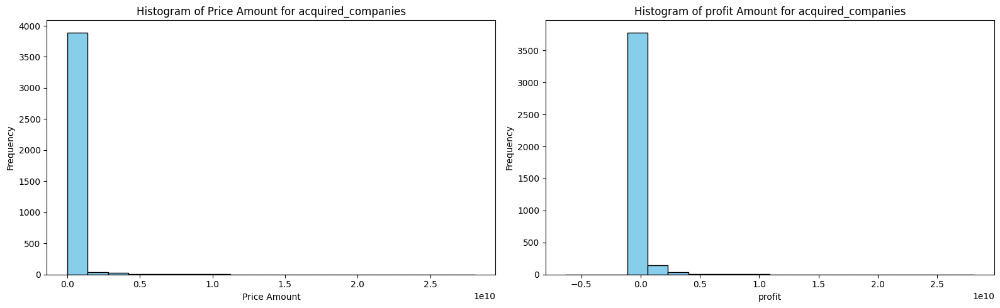

In [38]:
plt.figure(figsize=(16, 5))  # Adjust figsize as needed to fit both plots nicely
# First subplot (left)
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
plt.hist(df['price_amount'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Price Amount')
plt.ylabel('Frequency')
plt.title('Histogram of Price Amount for acquired_companies')

# Second subplot (right)
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
plt.hist(df['profit'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('profit')
plt.ylabel('Frequency')
plt.title('Histogram of profit Amount for acquired_companies')

# Adjust layout for better spacing
plt.tight_layout()

# Display the plots
plt.show()

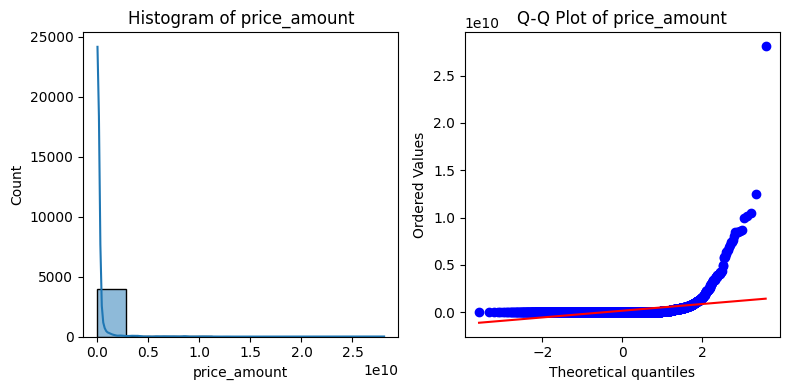

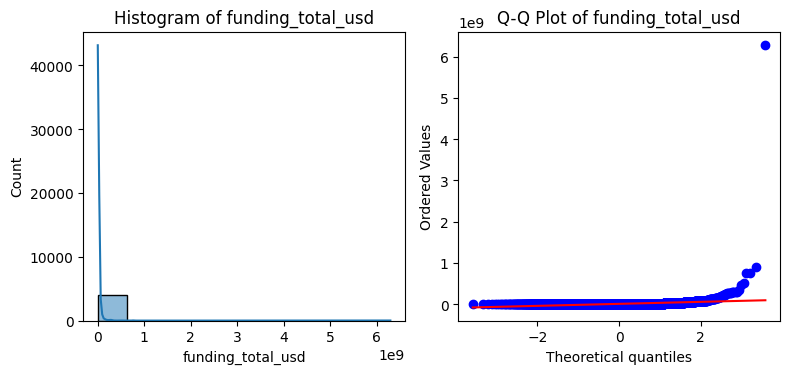

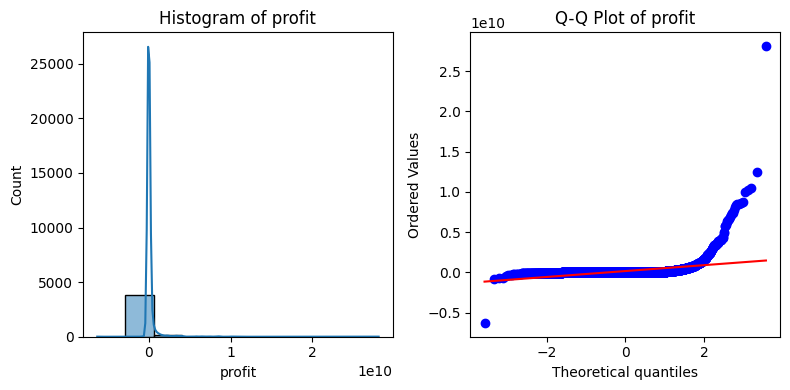

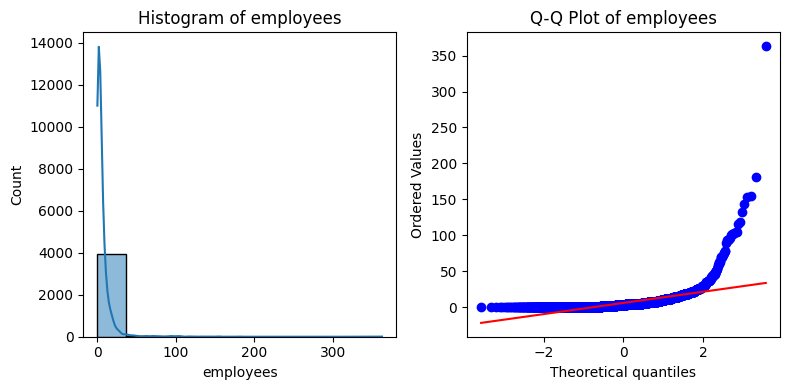

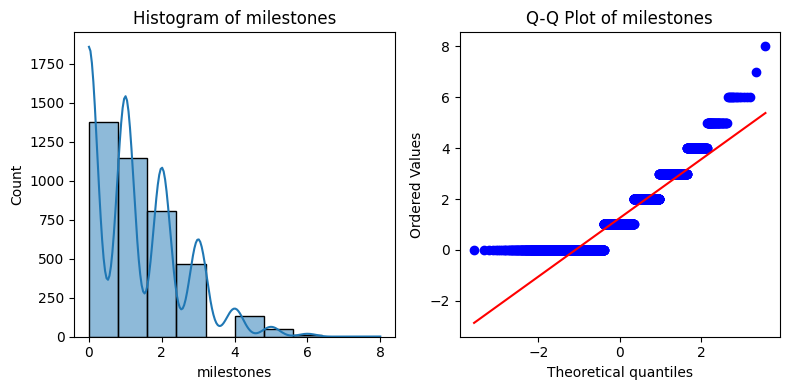

In [39]:
import pandas as pd
from scipy.stats import shapiro, anderson, probplot
import matplotlib.pyplot as plt
import seaborn as sns

def normality_test_graph(column_name, df):
    # Shapiro-Wilk test
    shapiro_stat, shapiro_p_value = shapiro(df[column_name])

    # Anderson-Darling test
    anderson_result = anderson(df[column_name])

    # Plotting histogram and Q-Q plot
    fig, ax = plt.subplots(1, 2, figsize=(8, 4))  # Smaller figure size

    # Histogram
    sns.histplot(df[column_name], bins=10, kde=True, ax=ax[0])
    ax[0].set_title(f'Histogram of {column_name}')

    # Q-Q Plot
    probplot(df[column_name], dist="norm", plot=ax[1])
    ax[1].set_title(f'Q-Q Plot of {column_name}')

    plt.tight_layout()
    plt.show()

# Performing normality tests for multiple columns and interpreting results
columns_to_test = ['price_amount', 'funding_total_usd', 'profit', 'employees', 'milestones']
for column in columns_to_test:
    results = normality_test_graph(column, df)

In [40]:
def normality_test(column_name, df):
    # Shapiro-Wilk test
    shapiro_stat, shapiro_p_value = shapiro(df[column_name])

    # Anderson-Darling test
    anderson_result = anderson(df[column_name])

    return {
        "Shapiro-Wilk Test Statistic": shapiro_stat,
        "Shapiro-Wilk p-value": shapiro_p_value,
        "Anderson-Darling Test Statistic": anderson_result.statistic,
        "Anderson-Darling Critical Values": anderson_result.critical_values,
        "Anderson-Darling Significance Levels": anderson_result.significance_level
    }

In [41]:
def interpret_normality_test(shapiro_result, anderson_result):
    # Unpack the results
    shapiro_stat = shapiro_result["Shapiro-Wilk Test Statistic"]
    shapiro_p_value = shapiro_result["Shapiro-Wilk p-value"]
    ad_stat = anderson_result["Anderson-Darling Test Statistic"]
    ad_critical_values = anderson_result["Anderson-Darling Critical Values"]

    # Shapiro-Wilk interpretation
    if shapiro_p_value < 0.05:
        shapiro_conclusion = "The data is not normally"
    else:
        shapiro_conclusion = "The data appears to be normally"

    # Anderson-Darling interpretation
    ad_conclusion = "The data is not normally"
    for i, cv in enumerate(ad_critical_values):
        if ad_stat < cv:
            ad_conclusion = f"The data appears to be normally distributed"
            break

    return shapiro_conclusion, ad_conclusion

# Performing normality tests for multiple columns and interpreting results
columns_to_test = ['price_amount', 'funding_total_usd', 'profit', 'employees', 'milestones']
def test_for_df(columns_to_test,df):
    for column in columns_to_test:
        results = normality_test(column, df)
        shapiro_conclusion, ad_conclusion = interpret_normality_test(results, results)

        print(f"{column} results:")
        print(f"Shapiro-Wilk interpretation: {shapiro_conclusion}")
        print(f"Anderson-Darling interpretation: {ad_conclusion}\n")
test_for_df(columns_to_test,df)
test_for_df(columns_to_test,df_independent)

price_amount results:
Shapiro-Wilk interpretation: The data is not normally
Anderson-Darling interpretation: The data is not normally

funding_total_usd results:
Shapiro-Wilk interpretation: The data is not normally
Anderson-Darling interpretation: The data is not normally

profit results:
Shapiro-Wilk interpretation: The data is not normally
Anderson-Darling interpretation: The data is not normally

employees results:
Shapiro-Wilk interpretation: The data is not normally
Anderson-Darling interpretation: The data is not normally

milestones results:
Shapiro-Wilk interpretation: The data is not normally
Anderson-Darling interpretation: The data is not normally

price_amount results:
Shapiro-Wilk interpretation: The data is not normally
Anderson-Darling interpretation: The data is not normally

funding_total_usd results:
Shapiro-Wilk interpretation: The data is not normally
Anderson-Darling interpretation: The data is not normally

profit results:
Shapiro-Wilk interpretation: The data is

##For top_10

In [42]:
top_10_contries=df['country_code'].value_counts().index[0:10]
top_10_category=df['category_code'].value_counts().index[0:10]
print(top_10_contries)
print(top_10_category)

Index(['USA', 'GBR', 'CAN', 'DEU', 'FRA', 'ISR', 'IND', 'AUS', 'SWE', 'NLD'], dtype='object', name='country_code')
Index(['software', 'web', 'mobile', 'enterprise', 'biotech', 'advertising',
       'games_video', 'ecommerce', 'other', 'network_hosting'],
      dtype='object', name='category_code')


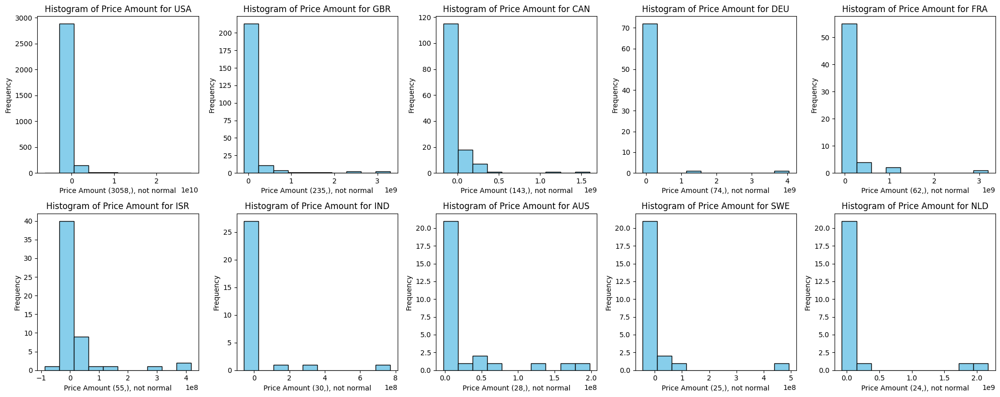

In [43]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))  # Adjust figsize and number of subplots as needed
axes = axes.flatten()
for i, country in enumerate(top_10_contries):
    # Filter data for the current country
    country_data = df[df['country_code'] == country]['profit']
    kstest_result = stats.kstest(country_data, 'norm')
    if kstest_result.pvalue<0.05:
      country_disterbute='not normal'
    else:
      country_disterbute='normal'
    shape_country=country_data.shape
    # Plot histogram on the corresponding subplot
    axes[i].hist(country_data, bins=10, color='skyblue', edgecolor='black')
    axes[i].set_title(f'Histogram of Price Amount for {country}')
    axes[i].set_xlabel(f'Price Amount {shape_country}, {country_disterbute}')
    axes[i].set_ylabel('Frequency')

# Adjust layout for better spacing
plt.tight_layout()

#Coraltion

We are going to use a Spearman Correlation because the data are not distribute normally.

In [44]:
from scipy.stats import spearmanr
numerical_df = df.select_dtypes(include=['number'])
numerical_values = numerical_df.values.flatten()

countries = ['USA', 'GBR', 'CAN', 'DEU', 'FRA', 'ISR', 'IND', 'AUS', 'SWE', 'NLD']

# Create binary columns for each country
for country in countries:
    numerical_df[country] = [1 if hop == country else 0 for hop in df['country_code']]
# Perform Spearman correlation test
correlation_matrix, p_value_matrix = spearmanr(numerical_df)

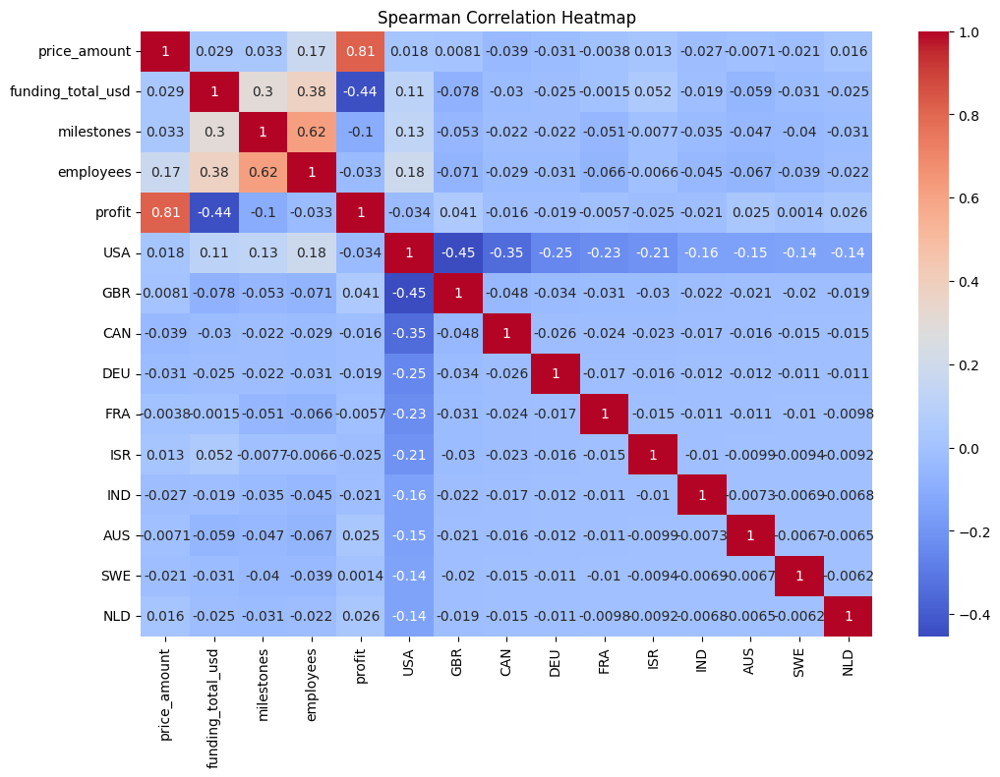

In [45]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt


# Create a heatmap for the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', xticklabels=numerical_df.columns, yticklabels=numerical_df.columns)
plt.title('Spearman Correlation Heatmap')
plt.show()


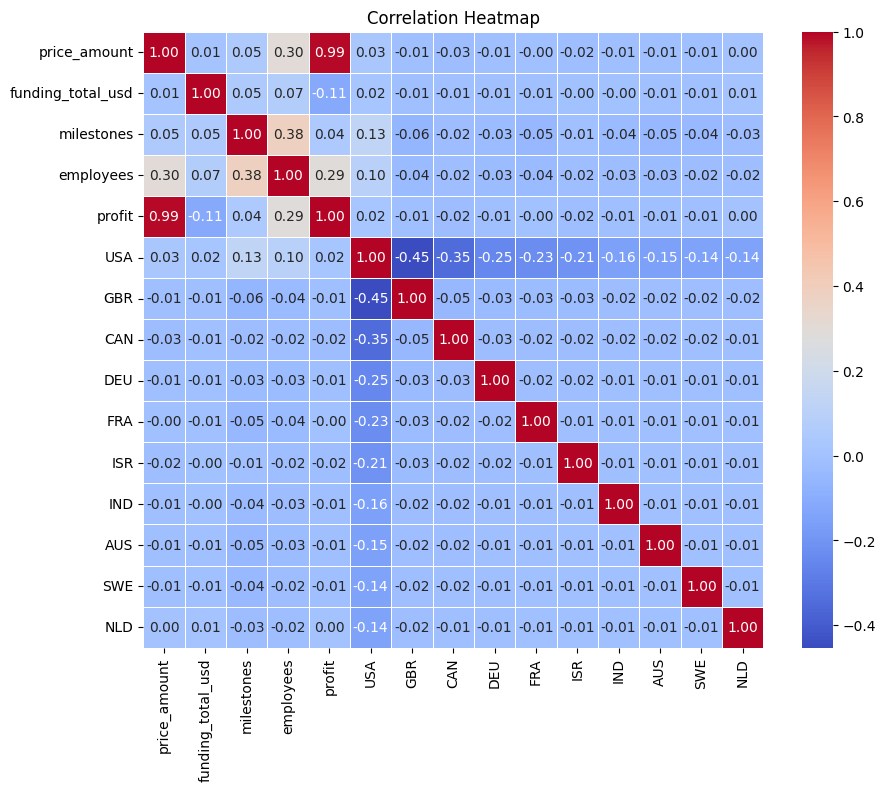

In [46]:

# Compute the correlation matrix
corr = numerical_df.corr()

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

#Nonparametics tests


##Nonparametric Tests for Independent

In [47]:
df_original=df.copy()
df=df_independent.copy()

###Wilcoxon- rank sum


We hypothesize that these are independent variables.
we take alpha that give us 95% accuracy.

H_0: df_county1 and df_county2 have the same  two independent samples come from the same distribution
H_1:we reject H_0

goal: to do this test for every country and every catagory

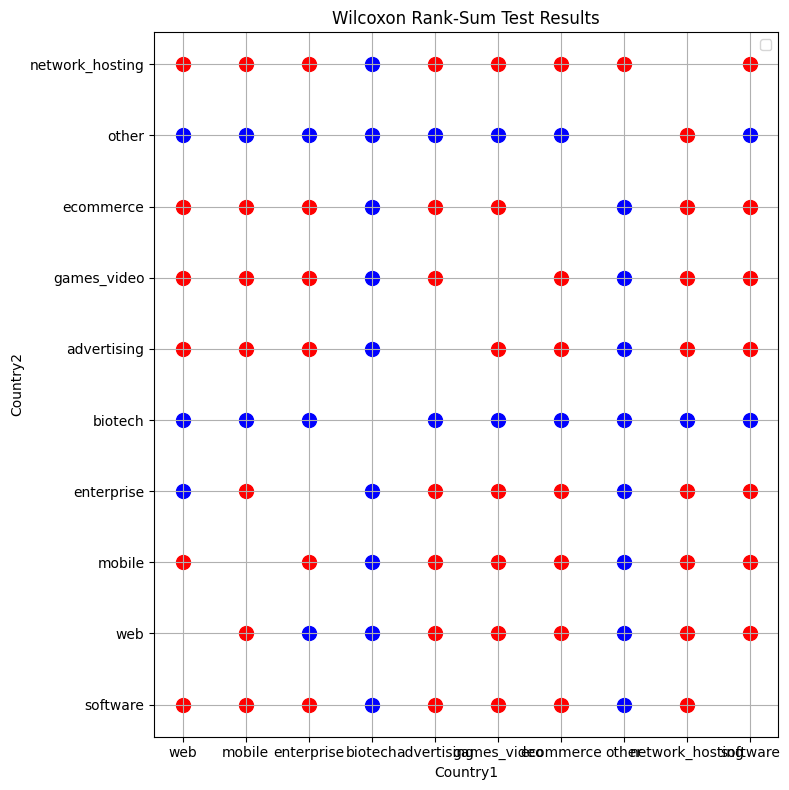

In [48]:
from scipy.stats import ranksums

# Initialize results dictionary
results = {}
alpha = 0.05  # Adjust significance level as needed
# Iterate through each pair of countries
for country4 in top_10_category:
    for country3 in top_10_category:
        # Skip comparing the country to itself
        if country3 == country4:
            continue

        # Filter data for the two countries
        country1 = df.loc[df['category_code'] == country4, 'profit']
        country2 = df.loc[df['category_code'] == country3, 'profit']
        # Perform the Wilcoxon rank-sum test
        statistic, p_value = ranksums(country1, country2)
        # Determine the result based on p-value
        if p_value < alpha:
            results[(country3, country4)] = 'Reject'
        else:
            results[(country3, country4)] = 'Cannot Reject'
# Colors dictionary for plotting
color_map = {'Reject': 'blue', 'Cannot Reject': 'red'}
# Plotting the results
plt.figure(figsize=(8, 8))

for (country3, country4), result in results.items():
    color = color_map[result]
    plt.scatter(country3, country4, color=color, s=100)

plt.xlabel('Country1')
plt.ylabel('Country2')
plt.title('Wilcoxon Rank-Sum Test Results')
plt.legend()

plt.grid(True)
plt.tight_layout()
plt.show()

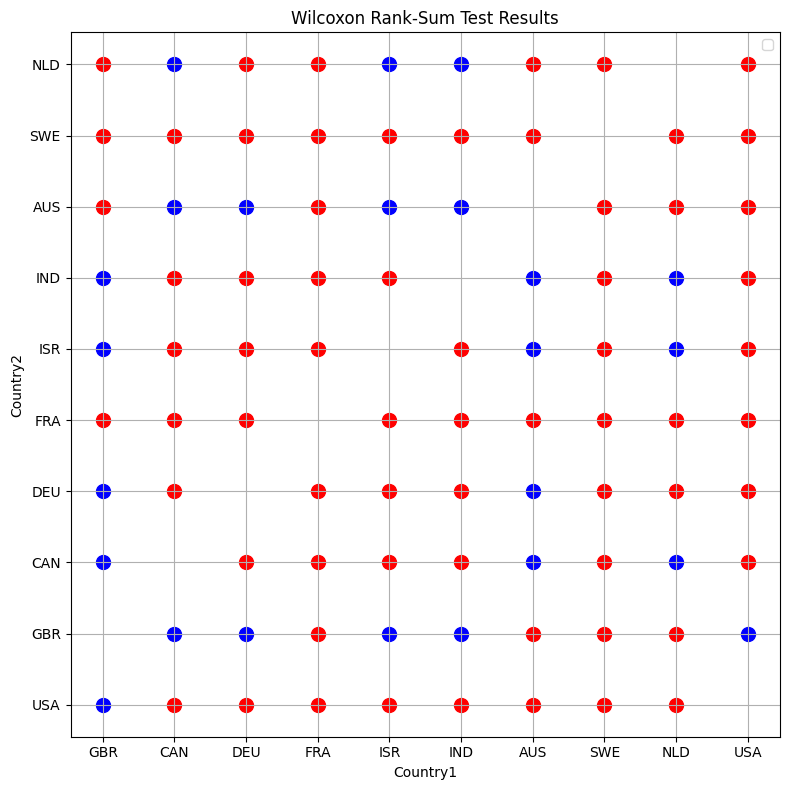

In [49]:
from scipy.stats import ranksums

# Initialize results dictionary
results = {}
alpha = 0.05  # Adjust significance level as needed
# Iterate through each pair of countries
for country4 in top_10_contries:
    for country3 in top_10_contries:
        # Skip comparing the country to itself
        if country3 == country4:
            continue

        # Filter data for the two countries
        country1 = df.loc[df['country_code'] == country4, 'profit']
        country2 = df.loc[df['country_code'] == country3, 'profit']
        # Perform the Wilcoxon rank-sum test
        statistic, p_value = ranksums(country1, country2)
        # Determine the result based on p-value
        if p_value < alpha:
            results[(country3, country4)] = 'Reject'
        else:
            results[(country3, country4)] = 'Cannot Reject'
# Colors dictionary for plotting
color_map = {'Reject': 'blue', 'Cannot Reject': 'red'}
# Plotting the results
plt.figure(figsize=(8, 8))

for (country3, country4), result in results.items():
    color = color_map[result]
    plt.scatter(country3, country4, color=color, s=100)

plt.xlabel('Country1')
plt.ylabel('Country2')
plt.title('Wilcoxon Rank-Sum Test Results')
plt.legend()

plt.grid(True)
plt.tight_layout()
plt.show()

In [50]:
df_web=df_independent[df_independent['category_code']=='web']

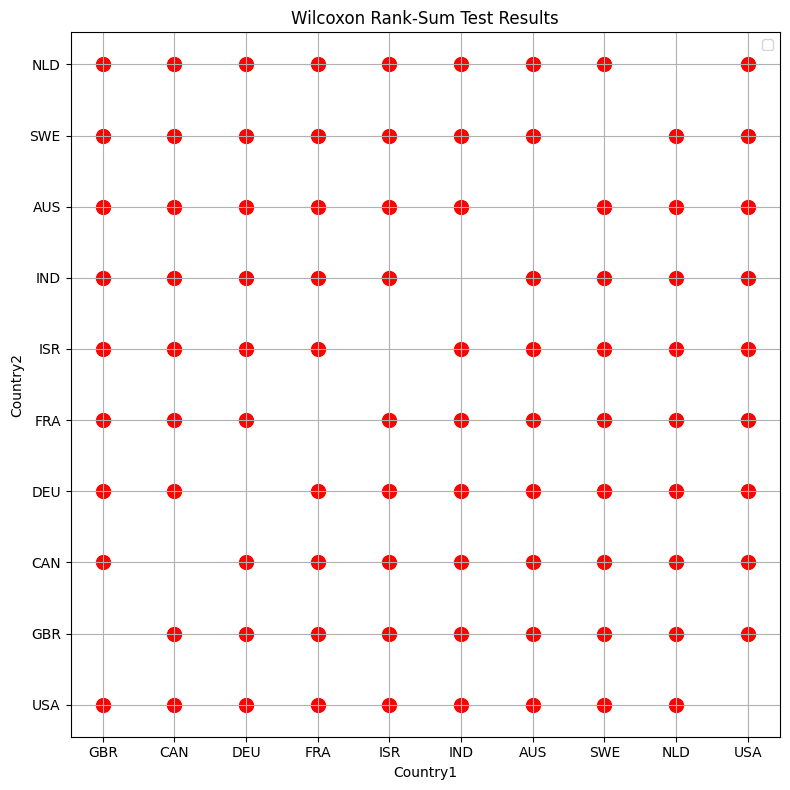

In [51]:
# Initialize results dictionary
results = {}
alpha = 0.05  # Adjust significance level as needed
# Iterate through each pair of countries
for country4 in top_10_contries:
    for country3 in top_10_contries:
        # Skip comparing the country to itself
        if country3 == country4:
            continue

        # Filter data for the two countries
        country1 = df_web.loc[df_web['country_code'] == country4, 'profit']
        country2 = df_web.loc[df_web['country_code'] == country3, 'profit']

        # Perform the Wilcoxon rank-sum test
        statistic, p_value = ranksums(country1, country2)
        # Determine the result based on p-value
        if p_value < alpha:
            results[(country3, country4)] = 'Reject'
        else:
            results[(country3, country4)] = 'Cannot Reject'
# Colors dictionary for plotting
color_map = {'Reject': 'blue', 'Cannot Reject': 'red'}

# Plotting the results
plt.figure(figsize=(8, 8))

for (country3, country4), result in results.items():
    color = color_map[result]
    plt.scatter(country3, country4, color=color, s=100)

plt.xlabel('Country1')
plt.ylabel('Country2')
plt.title('Wilcoxon Rank-Sum Test Results')
plt.legend()

plt.grid(True)
plt.tight_layout()
plt.show()

software


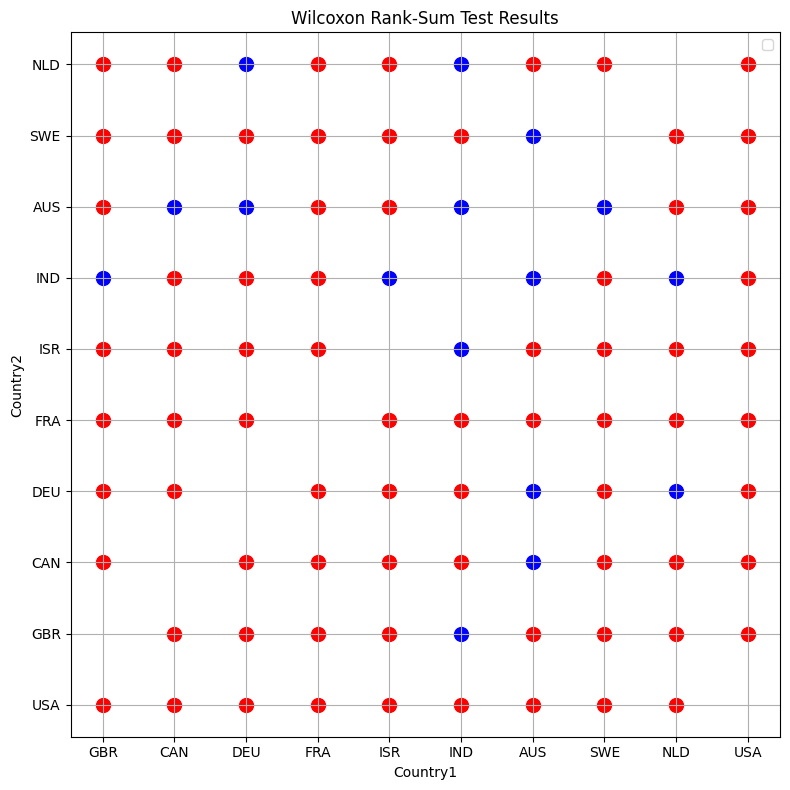

web


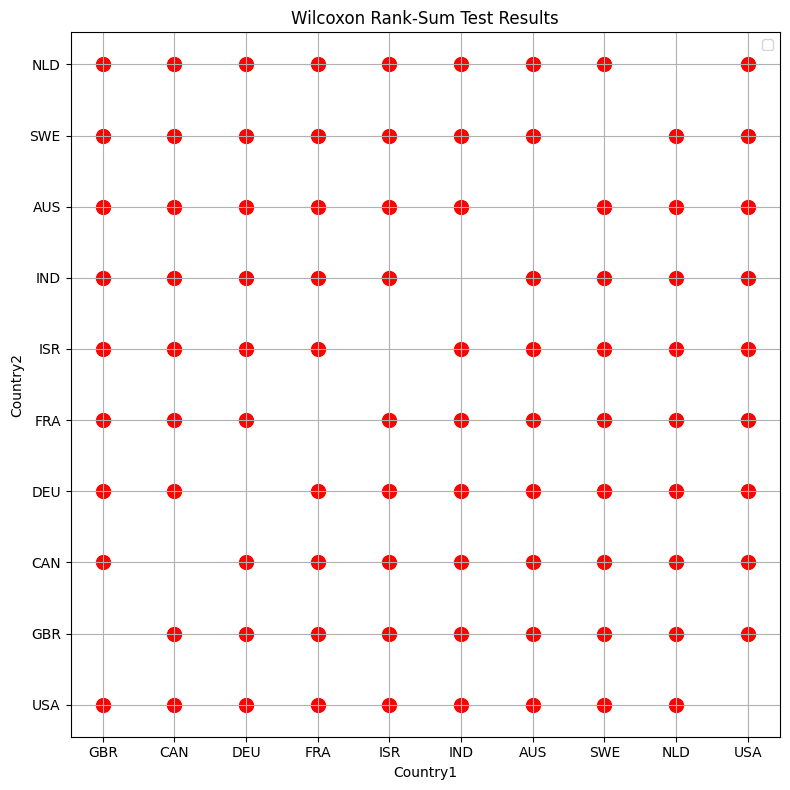

mobile


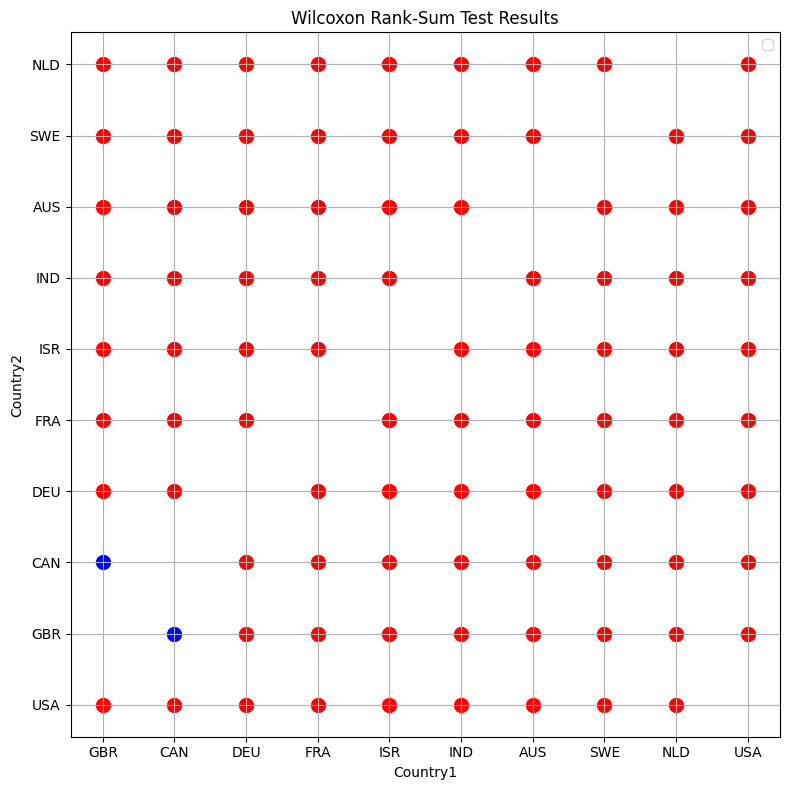

enterprise


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:9154: RuntimeWarning:

invalid value encountered in scalar divide



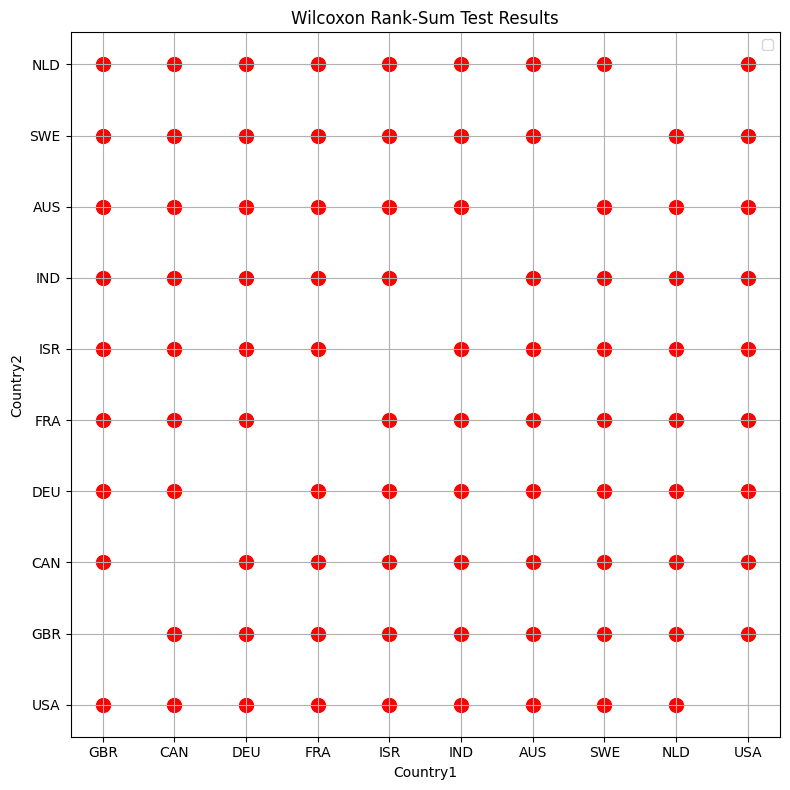

biotech


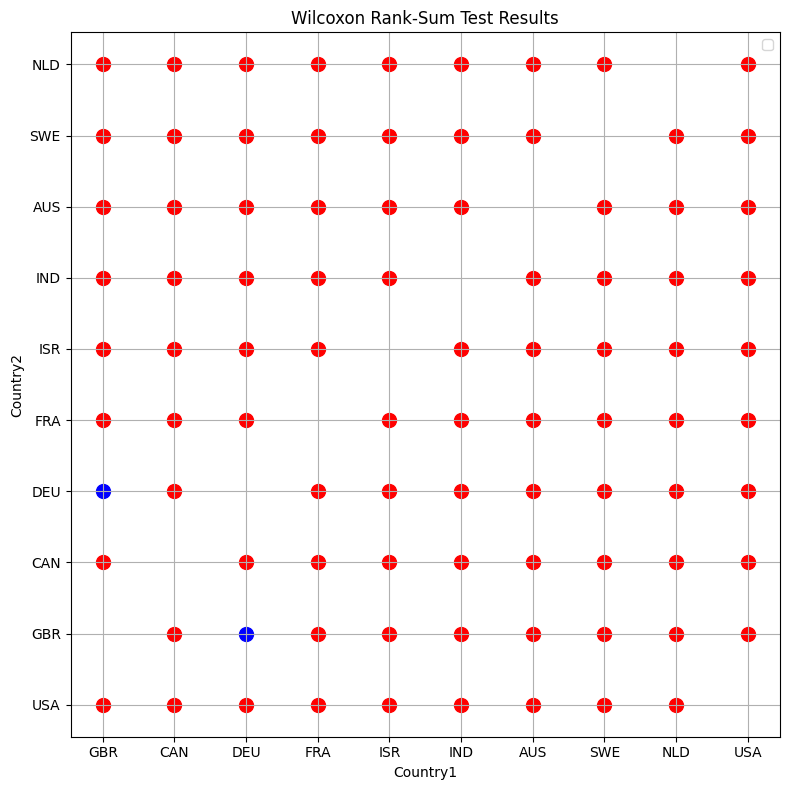

advertising


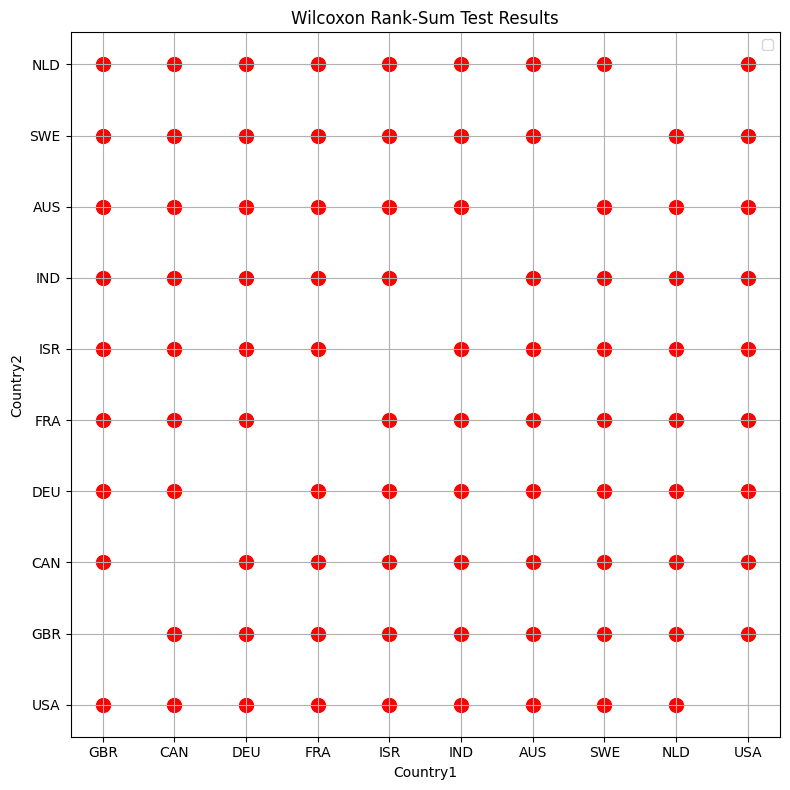

games_video


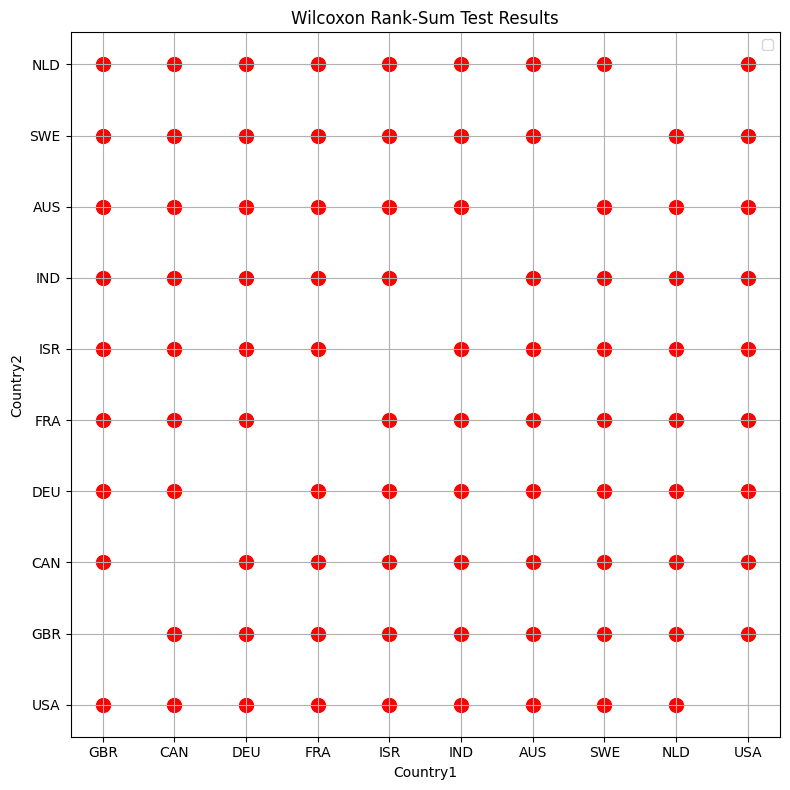

ecommerce


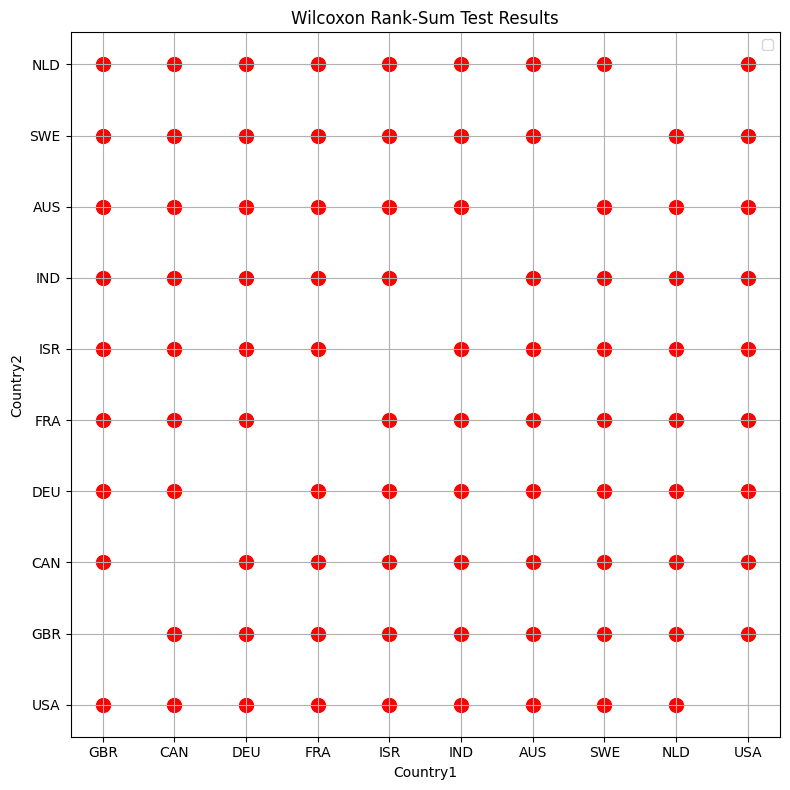

other


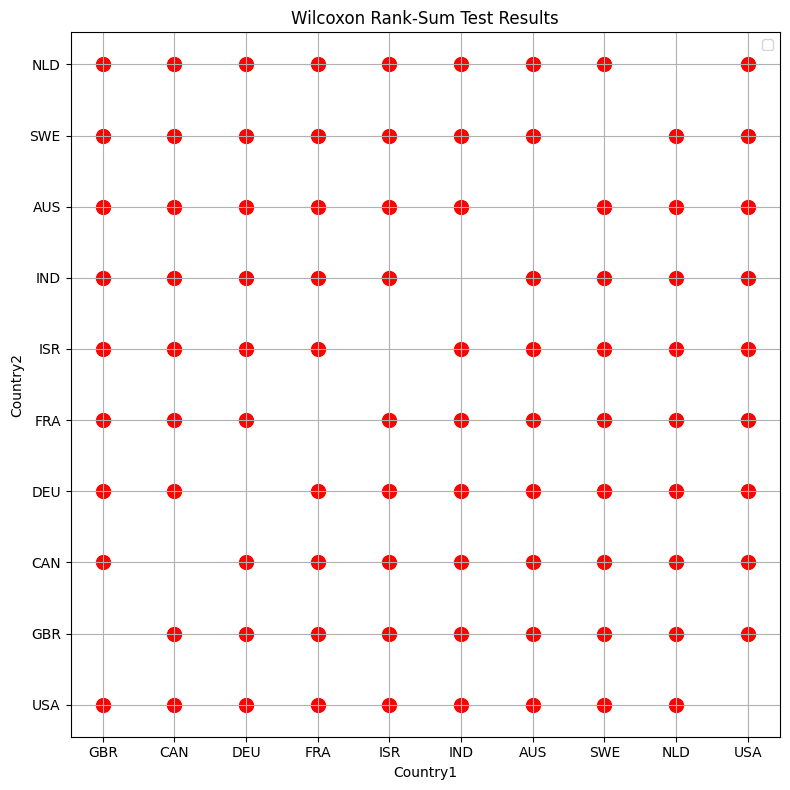

network_hosting


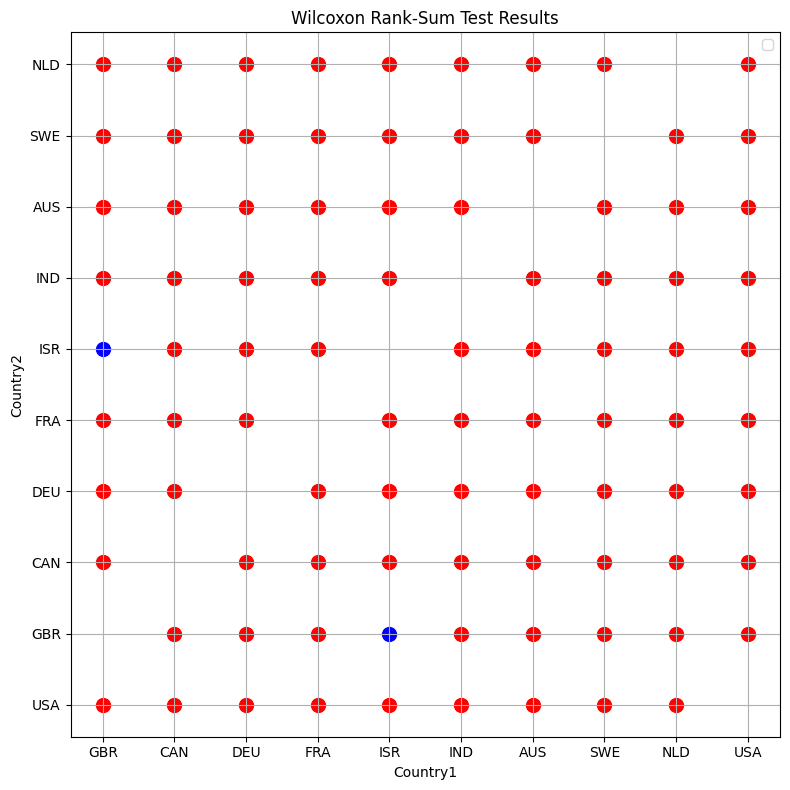

In [66]:
for country in top_10_category:
  df_web=df_independent[df_independent['category_code']==country]
  print(country)
  # Initialize results dictionary
  results = {}
  alpha = 0.05  # Adjust significance level as needed
  # Iterate through each pair of countries
  for country4 in top_10_contries:
      for country3 in top_10_contries:
          # Skip comparing the country to itself
          if country3 == country4:
              continue

          # Filter data for the two countries
          country1 = df_web.loc[df_web['country_code'] == country4, 'profit']
          country2 = df_web.loc[df_web['country_code'] == country3, 'profit']

          # Perform the Wilcoxon rank-sum test
          statistic, p_value = ranksums(country1, country2)
          # Determine the result based on p-value
          if p_value < alpha:
              results[(country3, country4)] = 'Reject'
          else:
              results[(country3, country4)] = 'Cannot Reject'
  # Colors dictionary for plotting
  color_map = {'Reject': 'blue', 'Cannot Reject': 'red'}

  # Plotting the results
  plt.figure(figsize=(8, 8))

  for (country3, country4), result in results.items():
      color = color_map[result]
      plt.scatter(country3, country4, color=color, s=100)

  plt.xlabel('Country1')
  plt.ylabel('Country2')
  plt.title('Wilcoxon Rank-Sum Test Results')
  plt.legend()

  plt.grid(True)
  plt.tight_layout()
  plt.show()

###Kruskal-Wallis-Test

The null hypothesis (H₀) for the Kruskal-Wallis test is:

H₀: The distributions of the dependent variable (in this case, profit) are the same across all groups (here, the different category_code values: mobile, music, and web).
The alternative hypothesis (H₁) is:

H₁: At least one group's distribution of profit is different from the others.

The Kruskal-Wallis test yields a test statistic of 2.13 and a p-value of 0.344. Since the p-value is greater than the common significance level (e.g., 0.05), we  reject the null hypothesis.

This suggests that there is no statistically significant difference in profit distributions across the different categories

In [52]:
from scipy.stats import kruskal
# Define a function to perform the Kruskal-Wallis test and check the hypothesis
def perform_kruskal_test(data, group_column, value_column, alpha=0.05):
    # Group data by the specified column and extract the values
    grouped_values = [group[value_column].values for _, group in data.groupby(group_column)]

    # Perform Kruskal-Wallis test
    stat, p_value = kruskal(*grouped_values)

    # Determine whether to reject the null hypothesis
    reject_null = p_value < alpha

    return stat, p_value, reject_null

# Run the test on the given DataFrame
stat, p_value, reject_null = perform_kruskal_test(df, "category_code", "profit")
print("in category_code we have:")
print(f"Test statistic: {stat}")
print(f"p-value: {p_value}")
print(f"Reject null hypothesis: {reject_null}")

in category_code we have:
Test statistic: 205.20249337215114
p-value: 3.47155118575673e-25
Reject null hypothesis: True


In [63]:
# Run the test on the given DataFrame
stat, p_value, reject_null = perform_kruskal_test(df, "country_code", "profit")
print("in country_code we have:")
print(f"Test statistic: {stat}")
print(f"p-value: {p_value}")
print(f"Reject null hypothesis: {reject_null}")

in country_code we have:
Test statistic: 80.9484239449005
p-value: 0.02494417570407554
Reject null hypothesis: True


In [64]:
for country4 in top_10_category:
  df_web=df_independent[df_independent['category_code']==country4]
  # Run the test on the given DataFrame
  stat, p_value, reject_null = perform_kruskal_test(df_web, "country_code", "profit")
  print(f"in {country4} we have:")
  print(f"Test statistic: {stat}")
  print(f"p-value: {p_value}")
  print(f"Reject null hypothesis: {reject_null}")

in software we have:
Test statistic: 30.403217987600346
p-value: 0.3940825951361225
Reject null hypothesis: False
in web we have:
Test statistic: 21.888348409790495
p-value: 0.8247830115860413
Reject null hypothesis: False
in mobile we have:
Test statistic: 32.521734344975634
p-value: 0.08977005613464933
Reject null hypothesis: False
in enterprise we have:
Test statistic: 6.86353400181057
p-value: 0.9613264396586647
Reject null hypothesis: False
in biotech we have:
Test statistic: 15.92246218132165
p-value: 0.8197153150636804
Reject null hypothesis: False
in advertising we have:
Test statistic: 4.233220390474987
p-value: 0.9884480540984356
Reject null hypothesis: False
in games_video we have:
Test statistic: 16.66799012466228
p-value: 0.3390962052609827
Reject null hypothesis: False
in ecommerce we have:
Test statistic: 23.70634369434421
p-value: 0.5363888755369693
Reject null hypothesis: False
in other we have:
Test statistic: 22.586443572778
p-value: 0.4253869430739792
Reject null hy

In [53]:
# Run the test on the given DataFrame
stat, p_value, reject_null = perform_kruskal_test(df, "employees", "milestones")
print("in category_code we have:")
print(f"Test statistic: {stat}")
print(f"p-value: {p_value}")
print(f"Reject null hypothesis: {reject_null}")

in category_code we have:
Test statistic: 1505.8483923131746
p-value: 2.3116134944906436e-266
Reject null hypothesis: True


In [54]:
# Run the test on the given DataFrame
stat, p_value, reject_null = perform_kruskal_test(df, "employees", "funding_total_usd")
print("in category_code we have:")
print(f"Test statistic: {stat}")
print(f"p-value: {p_value}")
print(f"Reject null hypothesis: {reject_null}")

in category_code we have:
Test statistic: 673.3530094243943
p-value: 5.710230191023299e-98
Reject null hypothesis: True


##Nonparametric Tests for Dependent Data

In [55]:
df=df_dependent.copy()

###Wilcoxon Signed-Rank Test

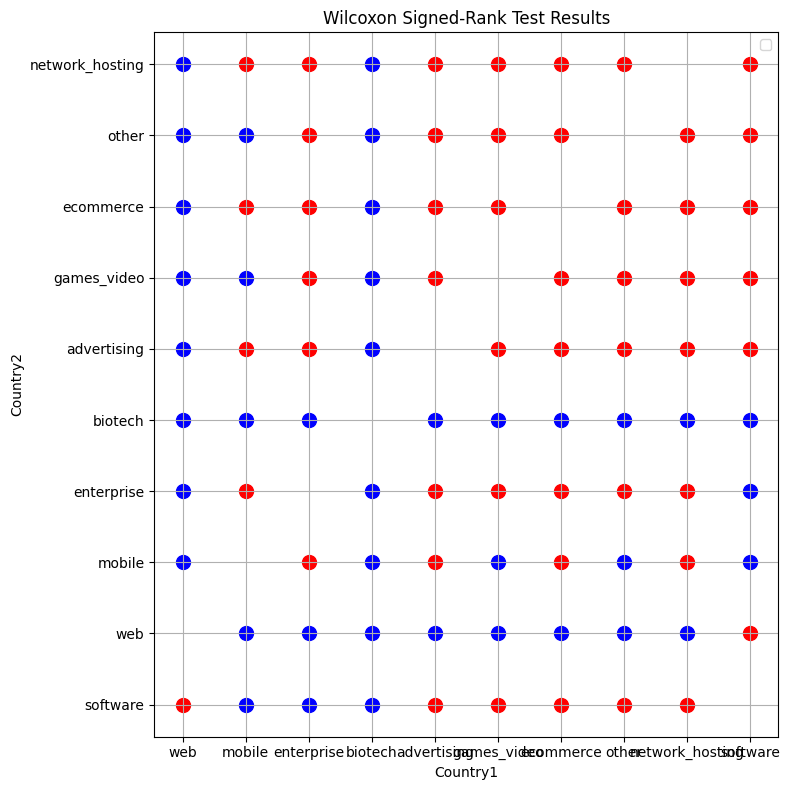

In [56]:
from scipy.stats import wilcoxon
import matplotlib.pyplot as plt

# Initialize results dictionary
results = {}
alpha = 0.05  # Adjust significance level as needed

# Iterate through each pair of countries
for country4 in top_10_category:
    for country3 in top_10_category:
        # Skip comparing the country to itself
        if country3 == country4:
            continue

        # Filter data for the two countries
        country1 = df.loc[df['category_code'] == country4, 'profit']
        country2 = df.loc[df['category_code'] == country3, 'profit']

        # Ensure both countries have the same number of observations for the test
        min_length = min(len(country1), len(country2))
        if min_length < 2:  # Need at least 2 paired samples
            continue

        # Perform the Wilcoxon signed-rank test
        statistic, p_value = wilcoxon(country1[:min_length], country2[:min_length])

        # Determine the result based on p-value
        if p_value < alpha:
            results[(country3, country4)] = 'Reject'
        else:
            results[(country3, country4)] = 'Cannot Reject'

# Colors dictionary for plotting
color_map = {'Reject': 'blue', 'Cannot Reject': 'red'}

# Plotting the results
plt.figure(figsize=(8, 8))

for (country3, country4), result in results.items():
    color = color_map[result]
    plt.scatter(country3, country4, color=color, s=100)

plt.xlabel('Country1')
plt.ylabel('Country2')
plt.title('Wilcoxon Signed-Rank Test Results')
plt.legend()

plt.grid(True)
plt.tight_layout()
plt.show()


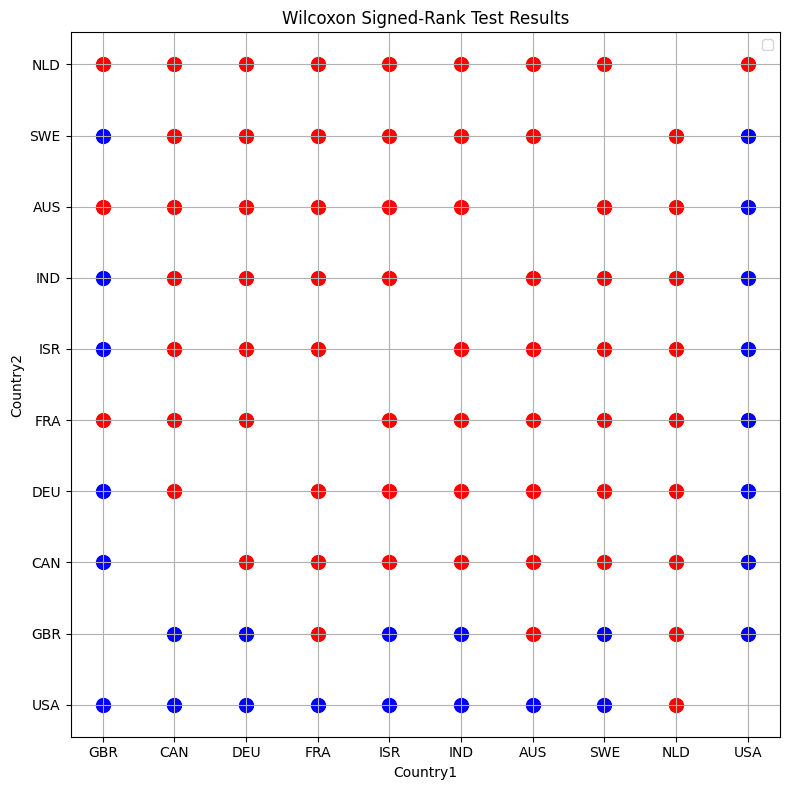

In [57]:
from scipy.stats import wilcoxon
import matplotlib.pyplot as plt

# Initialize results dictionary
results = {}
alpha = 0.05  # Adjust significance level as needed

# Iterate through each pair of countries
for country4 in top_10_contries:
    for country3 in top_10_contries:
        # Skip comparing the country to itself
        if country3 == country4:
            continue

        # Filter data for the two countries
        country1 = df.loc[df['country_code'] == country4, 'profit']
        country2 = df.loc[df['country_code'] == country3, 'profit']

        # Ensure both countries have the same number of observations for the test
        min_length = min(len(country1), len(country2))
        if min_length < 2:  # Need at least 2 paired samples
            continue

        # Perform the Wilcoxon signed-rank test
        statistic, p_value = wilcoxon(country1[:min_length], country2[:min_length])

        # Determine the result based on p-value
        if p_value < alpha:
            results[(country3, country4)] = 'Reject'
        else:
            results[(country3, country4)] = 'Cannot Reject'

# Colors dictionary for plotting
color_map = {'Reject': 'blue', 'Cannot Reject': 'red'}

# Plotting the results
plt.figure(figsize=(8, 8))

for (country3, country4), result in results.items():
    color = color_map[result]
    plt.scatter(country3, country4, color=color, s=100)

plt.xlabel('Country1')
plt.ylabel('Country2')
plt.title('Wilcoxon Signed-Rank Test Results')
plt.legend()

plt.grid(True)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/scipy/stats/_wilcoxon.py:199: UserWarning:

Sample size too small for normal approximation.



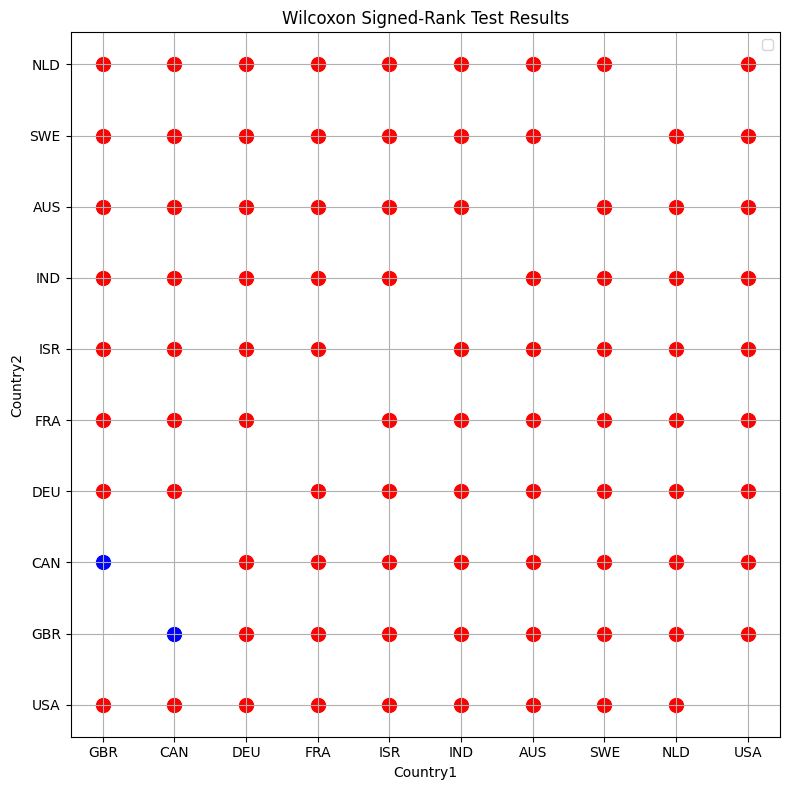

In [58]:
from scipy.stats import wilcoxon
import matplotlib.pyplot as plt

# Initialize results dictionary
results = {}
alpha = 0.05  # Adjust significance level as needed

# Iterate through each pair of countries
for country4 in top_10_contries:
    for country3 in top_10_contries:
        # Skip comparing the country to itself
        if country3 == country4:
            continue

        # Filter data for the two countries
        country1 = df_web.loc[df_web['country_code'] == country4, 'profit']
        country2 = df_web.loc[df_web['country_code'] == country3, 'profit']

        # Ensure both countries have the same number of observations for the test
        min_length = min(len(country1), len(country2))
        if min_length < 2:  # Need at least 2 paired samples
            continue

        # Perform the Wilcoxon signed-rank test
        statistic, p_value = wilcoxon(country1[:min_length], country2[:min_length])

        # Determine the result based on p-value
        if p_value < alpha:
            results[(country3, country4)] = 'Reject'
        else:
            results[(country3, country4)] = 'Cannot Reject'

# Colors dictionary for plotting
color_map = {'Reject': 'blue', 'Cannot Reject': 'red'}

# Plotting the results
plt.figure(figsize=(8, 8))

for (country3, country4), result in results.items():
    color = color_map[result]
    plt.scatter(country3, country4, color=color, s=100)

plt.xlabel('Country1')
plt.ylabel('Country2')
plt.title('Wilcoxon Signed-Rank Test Results')
plt.legend()

plt.grid(True)
plt.tight_layout()
plt.show()


#Transformation of the data

##Yeo-Johnson Transformation

The Yeo-Johnson transformation applies a similar concept as Box-Cox but allows for zero and negative values. Here’s how it works:

For
𝑦
≥
0
y≥0:

𝑇
(
𝑦
)
=
(
𝑦
+
1
)
𝜆
−
1
𝜆
if
𝜆
≠
0
T(y)=
λ
(y+1)
λ
 −1
​
 if λ

=0
𝑇
(
𝑦
)
=
log
⁡
(
𝑦
+
1
)
if
𝜆
=
0
T(y)=log(y+1)if λ=0
For
𝑦
<
0
y<0:

𝑇
(
𝑦
)
=
−
(
−
𝑦
+
1
)
2
−
𝜆
−
1
2
−
𝜆
if
𝜆
≠
2
T(y)=−
2−λ
(−y+1)
2−λ
 −1
​
 if λ

=2
𝑇
(
𝑦
)
=
−
log
⁡
(
−
𝑦
+
1
)
if
𝜆
=
2
T(y)=−log(−y+1)if λ=2

Null Hypothesis:

The null hypothesis for both tests typically states that there is no difference in the means of the two groups (in this case, the profit between low and high employee groups).

In [70]:
from sklearn.preprocessing import PowerTransformer
from scipy import stats

# Initialize Yeo-Johnson transformer
pt = PowerTransformer(method='yeo-johnson')
df['transformed_profit'] = pt.fit_transform(df[['profit']])
# Extract the lambda value
lambda_value = pt.lambdas_[0]  # Since 'profit' is a single feature

print(f'Lambda value: {lambda_value}')
# Define groups based on employees
# Let's create two groups: "Low Employees" and "High Employees" based on a threshold (e.g., 10)
df['employee_group'] = np.where(df['employees'] > 10, 'High', 'Low')

# Split data into two groups
group_low = df[df['employee_group'] == 'Low']['transformed_profit']
group_high = df[df['employee_group'] == 'High']['transformed_profit']

# Perform T-Test
t_stat, p_value_t = stats.ttest_ind(group_low, group_high)
print(f"T-Test: Statistic = {t_stat}, p-value = {p_value_t}")

# Perform Z-Test (manual calculation)
mean_low, mean_high = np.mean(group_low), np.mean(group_high)
std_low, std_high = np.std(group_low, ddof=1), np.std(group_high, ddof=1)
n_low, n_high = len(group_low), len(group_high)
print(f"mean_low: {mean_low}")
print(f"mean_high: {mean_high}")
print(f"std_low: {std_low}")
print(f"std_high: {std_high}")
# Pooled standard deviation
pooled_std = np.sqrt(((n_low - 1) * std_low**2 + (n_high - 1) * std_high**2) / (n_low + n_high - 2))
z_stat = (mean_low - mean_high) / (pooled_std * np.sqrt(1/n_low + 1/n_high))
p_value_z = 2 * (1 - stats.norm.cdf(np.abs(z_stat)))  # Two-tailed test
print(f"Z-Test: Statistic = {z_stat}, p-value = {p_value_z}")

Lambda value: 0.9521103330735048
T-Test: Statistic = -4.860804375101856, p-value = 1.2140815048134555e-06
mean_low: -0.03202425209832913
mean_high: 0.18386897446321077
std_low: 0.5739998461500686
std_high: 2.1951882007844343
Z-Test: Statistic = -4.860804375101866, p-value = 1.1690973962252826e-06


P-Value:

Both tests yield very low p-values (much lower than the common significance level of
0.05
0.05).
This indicates that you can reject the null hypothesis. There is strong evidence to suggest that there is a significant difference in profits between the "Low" and "High" employee groups.

Test Statistic:

The negative test statistic indicates that the mean profit of the "Low" employee group is significantly lower than that of the "High" employee group.
Specifically, this means that as the number of employees increases, the profit tends to be higher.

In [69]:
from sklearn.preprocessing import PowerTransformer
from scipy import stats

# Initialize Yeo-Johnson transformer
pt = PowerTransformer(method='yeo-johnson')
df['transformed_profit'] = pt.fit_transform(df[['profit']])
# Extract the lambda value
lambda_value = pt.lambdas_[0]  # Since 'profit' is a single feature

print(f'Lambda value: {lambda_value}')
# Define groups based on employees
# Let's create two groups: "Low Employees" and "High Employees" based on a threshold (e.g., 10)
df['employee_group'] = np.where(df['milestones'] >5, 'High', 'Low')

# Split data into two groups
group_low = df[df['employee_group'] == 'Low']['transformed_profit']
group_high = df[df['employee_group'] == 'High']['transformed_profit']

# Perform T-Test
t_stat, p_value_t = stats.ttest_ind(group_low, group_high)
print(f"T-Test: Statistic = {t_stat}, p-value = {p_value_t}")

# Perform Z-Test (manual calculation)
mean_low, mean_high = np.mean(group_low), np.mean(group_high)
std_low, std_high = np.std(group_low, ddof=1), np.std(group_high, ddof=1)
n_low, n_high = len(group_low), len(group_high)

# Pooled standard deviation
pooled_std = np.sqrt(((n_low - 1) * std_low**2 + (n_high - 1) * std_high**2) / (n_low + n_high - 2))
z_stat = (mean_low - mean_high) / (pooled_std * np.sqrt(1/n_low + 1/n_high))
p_value_z = 2 * (1 - stats.norm.cdf(np.abs(z_stat)))  # Two-tailed test
print(f"Z-Test: Statistic = {z_stat}, p-value = {p_value_z}")

Lambda value: 0.9521103330735048
T-Test: Statistic = -2.558447071779453, p-value = 0.010550694358580998
Z-Test: Statistic = -2.558447071779443, p-value = 0.010514082410909786


In [71]:
df.columns

Index(['id', 'acquiring_object_id', 'price_amount', 'funding_total_usd',
       'acquired_at', 'milestones', 'employees', 'category_code',
       'country_code', 'profit', 'transformed_profit', 'employee_group'],
      dtype='object')

In [72]:
from sklearn.preprocessing import PowerTransformer
from scipy import stats

# Initialize Yeo-Johnson transformer
pt = PowerTransformer(method='yeo-johnson')
df['transformed_profit'] = pt.fit_transform(df[['funding_total_usd']])
# Extract the lambda value
lambda_value = pt.lambdas_[0]  # Since 'profit' is a single feature

print(f'Lambda value: {lambda_value}')
# Define groups based on employees
# Let's create two groups: "Low Employees" and "High Employees" based on a threshold (e.g., 10)
df['employee_group'] = np.where(df['employees'] > 10, 'High', 'Low')

# Split data into two groups
group_low = df[df['employee_group'] == 'Low']['transformed_profit']
group_high = df[df['employee_group'] == 'High']['transformed_profit']

# Perform T-Test
t_stat, p_value_t = stats.ttest_ind(group_low, group_high)
print(f"T-Test: Statistic = {t_stat}, p-value = {p_value_t}")

# Perform Z-Test (manual calculation)
mean_low, mean_high = np.mean(group_low), np.mean(group_high)
std_low, std_high = np.std(group_low, ddof=1), np.std(group_high, ddof=1)
n_low, n_high = len(group_low), len(group_high)
print(f"mean_low: {mean_low}")
print(f"mean_high: {mean_high}")
print(f"std_low: {std_low}")
print(f"std_high: {std_high}")
# Pooled standard deviation
pooled_std = np.sqrt(((n_low - 1) * std_low**2 + (n_high - 1) * std_high**2) / (n_low + n_high - 2))
z_stat = (mean_low - mean_high) / (pooled_std * np.sqrt(1/n_low + 1/n_high))
p_value_z = 2 * (1 - stats.norm.cdf(np.abs(z_stat)))  # Two-tailed test
print(f"Z-Test: Statistic = {z_stat}, p-value = {p_value_z}")

Lambda value: -0.0465687608316315
T-Test: Statistic = -12.033967337968823, p-value = 8.653476596424688e-33
mean_low: -0.07811213514356045
mean_high: 0.4484850462043292
std_low: 0.9790272050619737
std_high: 1.0027232525623242
Z-Test: Statistic = -12.033967337968885, p-value = 0.0


In [78]:
# Filter the DataFrame for top 10 countries
df_top_countries = df[df['country_code'].isin(top_10_contries)]

# Prepare the data for ANOVA
# Group the transformed profits by country
grouped_data = [df_top_countries[df_top_countries['country_code'] == country]['transformed_profit'].values for country in top_10_contries]

# Perform ANOVA
anova_stat, p_value_anova = stats.f_oneway(*grouped_data)

# Display results
print(f"ANOVA: Statistic = {anova_stat}, p-value = {p_value_anova}")

# Interpretation
if p_value_anova < 0.05:
    print("Reject the null hypothesis: There are significant differences in profits among the top 10 countries.")
else:
    print("Cannot reject the null hypothesis: No significant differences in profits among the top 10 countries.")

ANOVA: Statistic = 8.265952539672138, p-value = 2.814553138660224e-12
Reject the null hypothesis: There are significant differences in profits among the top 10 countries.


In [77]:
# Filter the DataFrame for top 10 countries
df_top_countries = df[df['category_code'].isin(top_10_category)]

# Prepare the data for ANOVA
# Group the transformed profits by country
grouped_data = [df_top_countries[df_top_countries['category_code'] == country]['transformed_profit'].values for country in top_10_contries]

# Perform ANOVA
anova_stat, p_value_anova = stats.f_oneway(*grouped_data)

# Display results
print(f"ANOVA: Statistic = {anova_stat}, p-value = {p_value_anova}")

# Interpretation
if p_value_anova < 0.05:
    print("Reject the null hypothesis: There are significant differences in profits among the top 10 countries.")
else:
    print("Cannot reject the null hypothesis: No significant differences in profits among the top 10 countries.")

ANOVA: Statistic = nan, p-value = nan
Cannot reject the null hypothesis: No significant differences in profits among the top 10 countries.


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4102: DegenerateDataWarning:

at least one input has length 0



In [79]:
df.head()

,id,acquiring_object_id,price_amount,funding_total_usd,acquired_at,milestones,employees,category_code,country_code,profit,transformed_profit,employee_group
0,c:72,c:59,60000000.0,4.153434e+06,2007-07-01,4,9,mobile,USA,5.584657e+07,1.057332,Low
1,c:132,c:24,280000000.0,5.127412e+06,2007-05-01,5,21,music,GBR,2.748726e+08,1.075757,High
2,c:155,c:59,100000000.0,8.470731e+06,2007-06-01,4,16,web,USA,9.152927e+07,1.118942,High
3,c:215,c:212,25000000.0,0.000000e+00,2007-07-01,0,2,web,USA,2.500000e+07,-0.892935,Low
4,c:228,c:227,7140000.0,0.000000e+00,2003-08-05,4,1,web,KOR,7.140000e+06,-0.892935,Low
